FAKES NEWS DETECTION USING LSTM

In [52]:
import tensorflow as tf
from tensorflow.keras.layers import LSTM, GRU, Dense, Embedding, Dropout,Bidirectional
from tensorflow.keras.preprocessing import text, sequence 
from tensorflow.keras.models import Sequential
from sklearn.model_selection import train_test_split
import pandas as pd
import numpy as np
#for text cleaning
import string
import re
import nltk
nltk.download('all')
from nltk.tokenize import word_tokenize,sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import gensim
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

import tensorflow as tf
from tensorflow.keras.preprocessing import text, sequence
from tensorflow.keras.preprocessing.text import one_hot
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, Dense, LSTM, Dropout, GRU
from tensorflow.keras.callbacks import History 

from wordcloud import WordCloud, STOPWORDS


#for visualization
import matplotlib.pyplot as plt
%matplotlib inline

[nltk_data] Downloading collection 'all'
[nltk_data]    | 
[nltk_data]    | Downloading package abc to /root/nltk_data...
[nltk_data]    |   Package abc is already up-to-date!
[nltk_data]    | Downloading package alpino to /root/nltk_data...
[nltk_data]    |   Package alpino is already up-to-date!
[nltk_data]    | Downloading package averaged_perceptron_tagger to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Package averaged_perceptron_tagger is already up-
[nltk_data]    |       to-date!
[nltk_data]    | Downloading package averaged_perceptron_tagger_ru to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Package averaged_perceptron_tagger_ru is already
[nltk_data]    |       up-to-date!
[nltk_data]    | Downloading package basque_grammars to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Package basque_grammars is already up-to-date!
[nltk_data]    | Downloading package biocreative_ppi to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Pac

In [53]:
from google.colab import drive
drive.mount("/content/gdrive")


Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [54]:
fake_real_data =pd.read_csv('/content/gdrive/MyDrive/data.csv',encoding ='utf8')

In [ ]:
fake_real_data.describe()

,title,text,subject,date,target
count,44898,44898,44898,44898,44898
unique,38729,38646,8,2397,2
top,Factbox: Trump fills top jobs for his administ...,,politicsNews,"December 20, 2017",fake
freq,14,627,11272,182,23481


In [ ]:
fake_real_data.target.value_counts()

fake    23481
true    21417
Name: target, dtype: int64

In [ ]:
fake_real_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44898 entries, 0 to 44897
Data columns (total 5 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   title    44898 non-null  object
 1   text     44898 non-null  object
 2   subject  44898 non-null  object
 3   date     44898 non-null  object
 4   target   44898 non-null  object
dtypes: object(5)
memory usage: 1.7+ MB


There are no null values.So we can go ahead with further processing and cleaning

In [ ]:
fake_real_data.isnull().sum()

title      0
text       0
subject    0
date       0
target     0
dtype: int64

Transforming text values of Target output column to 0s and 1s for better learning.

In [55]:
fake_real_data['target'] = np.where(fake_real_data['target'] == "true", 1, 0)


In [ ]:
fake_real_data.target.value_counts()

0    23481
1    21417
Name: target, dtype: int64

In [ ]:
fake_real_data.shape

(44898, 5)

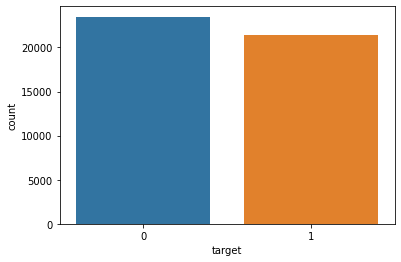

In [ ]:
import seaborn as sns
fig = sns.countplot(x="target",data=fake_real_data)
fig

In [ ]:
fake_real_data.head()

,title,text,subject,date,target
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017",0
1,Drunk Bragging Trump Staffer Started Russian ...,House Intelligence Committee Chairman Devin Nu...,News,"December 31, 2017",0
2,Sheriff David Clarke Becomes An Internet Joke...,"On Friday, it was revealed that former Milwauk...",News,"December 30, 2017",0
3,Trump Is So Obsessed He Even Has Obama’s Name...,"On Christmas day, Donald Trump announced that ...",News,"December 29, 2017",0
4,Pope Francis Just Called Out Donald Trump Dur...,Pope Francis used his annual Christmas Day mes...,News,"December 25, 2017",0


In [ ]:
fake_real_data.subject.value_counts()

politicsNews       11272
worldnews          10145
News                9050
politics            6841
left-news           4459
Government News     1570
US_News              783
Middle-east          778
Name: subject, dtype: int64

Politics and PoliticNews believe to be under same subject.Hence merging them under Politicnews

In [ ]:
fake_real_data.subject=fake_real_data.subject.replace({'politics':'PoliticsNews','politicsNews':'PoliticsNews'})
fake_real_data['transformed_text'] = fake_real_data['title'] + ' ' + fake_real_data['text']
fake_real_data.head()

,title,text,subject,date,target,transformed_text
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017",fake,Donald Trump Sends Out Embarrassing New Year’...
1,Drunk Bragging Trump Staffer Started Russian ...,House Intelligence Committee Chairman Devin Nu...,News,"December 31, 2017",fake,Drunk Bragging Trump Staffer Started Russian ...
2,Sheriff David Clarke Becomes An Internet Joke...,"On Friday, it was revealed that former Milwauk...",News,"December 30, 2017",fake,Sheriff David Clarke Becomes An Internet Joke...
3,Trump Is So Obsessed He Even Has Obama’s Name...,"On Christmas day, Donald Trump announced that ...",News,"December 29, 2017",fake,Trump Is So Obsessed He Even Has Obama’s Name...
4,Pope Francis Just Called Out Donald Trump Dur...,Pope Francis used his annual Christmas Day mes...,News,"December 25, 2017",fake,Pope Francis Just Called Out Donald Trump Dur...


In [ ]:
fake_real_data[['target','subject','transformed_text']].groupby(['target','subject']).count()


transformed_text
target subject                          
fake   Government News              1570
       Middle-east                   778
       News                         9050
       PoliticsNews                 6841
       US_News                       783
       left-news                    4459
true   PoliticsNews                11272
       worldnews                   10145

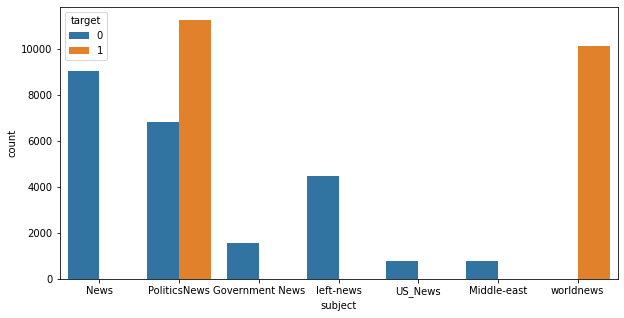

In [ ]:
plt.figure(figsize=(10,5))
sns.countplot(x= "subject", hue = "target", data=fake_real_data)

Observed from the above that politics and worldnews coverage is more than the other subjects.

# Data Cleaning Process

In [56]:
%%time
def clean_text(txt):
    """""
    cleans the input text in the following steps
    1- replace contractions
    2- removing punctuation
    3- spliting into words
    4- removing stopwords
    5- removing leftover punctuations
    """""
    contraction_dict = {"ain't": "is not", "aren't": "are not","can't": "cannot", "'cause": "because", "could've": "could have", "couldn't": "could not", "didn't": "did not",  "doesn't": "does not", "don't": "do not", "hadn't": "had not", "hasn't": "has not", "haven't": "have not", "he'd": "he would","he'll": "he will", "he's": "he is", "how'd": "how did", "how'd'y": "how do you", "how'll": "how will", "how's": "how is",  "I'd": "I would", "I'd've": "I would have", "I'll": "I will", "I'll've": "I will have","I'm": "I am", "I've": "I have", "i'd": "i would", "i'd've": "i would have", "i'll": "i will",  "i'll've": "i will have","i'm": "i am", "i've": "i have", "isn't": "is not", "it'd": "it would", "it'd've": "it would have", "it'll": "it will", "it'll've": "it will have","it's": "it is", "let's": "let us", "ma'am": "madam", "mayn't": "may not", "might've": "might have","mightn't": "might not","mightn't've": "might not have", "must've": "must have", "mustn't": "must not", "mustn't've": "must not have", "needn't": "need not", "needn't've": "need not have","o'clock": "of the clock", "oughtn't": "ought not", "oughtn't've": "ought not have", "shan't": "shall not", "sha'n't": "shall not", "shan't've": "shall not have", "she'd": "she would", "she'd've": "she would have", "she'll": "she will", "she'll've": "she will have", "she's": "she is", "should've": "should have", "shouldn't": "should not", "shouldn't've": "should not have", "so've": "so have","so's": "so as", "this's": "this is","that'd": "that would", "that'd've": "that would have", "that's": "that is", "there'd": "there would", "there'd've": "there would have", "there's": "there is", "here's": "here is","they'd": "they would", "they'd've": "they would have", "they'll": "they will", "they'll've": "they will have", "they're": "they are", "they've": "they have", "to've": "to have", "wasn't": "was not", "we'd": "we would", "we'd've": "we would have", "we'll": "we will", "we'll've": "we will have", "we're": "we are", "we've": "we have", "weren't": "were not", "what'll": "what will", "what'll've": "what will have", "what're": "what are",  "what's": "what is", "what've": "what have", "when's": "when is", "when've": "when have", "where'd": "where did", "where's": "where is", "where've": "where have", "who'll": "who will", "who'll've": "who will have", "who's": "who is", "who've": "who have", "why's": "why is", "why've": "why have", "will've": "will have", "won't": "will not", "won't've": "will not have", "would've": "would have", "wouldn't": "would not", "wouldn't've": "would not have", "y'all": "you all", "y'all'd": "you all would","y'all'd've": "you all would have","y'all're": "you all are","y'all've": "you all have","you'd": "you would", "you'd've": "you would have", "you'll": "you will", "you'll've": "you will have", "you're": "you are", "you've": "you have"}
    def _get_contractions(contraction_dict):
        contraction_re = re.compile('(%s)' % '|'.join(contraction_dict.keys()))
        return contraction_dict, contraction_re

    def replace_contractions(text):
        contractions, contractions_re = _get_contractions(contraction_dict)
        def replace(match):
            return contractions[match.group(0)]
        return contractions_re.sub(replace, text)

    # replace contractions and convert to lowercase
    txt = txt.lower()
    txt = replace_contractions(txt)
    
    #remove punctuations
    txt  = "".join([char for char in txt if char not in string.punctuation])
    txt = re.sub('[0-9]+', '', txt)
    
    # split into words
    words = word_tokenize(txt)
    
    # remove stopwords
    stop_words = set(stopwords.words('english'))
    words = [w for w in words if not w in stop_words]
    
    # removing leftover punctuations
    words = [word for word in words if word.isalpha()]

    lemmatizer = nltk.stem.WordNetLemmatizer()
    def lemmatize_text(txt):
        return [lemmatizer.lemmatize(w) for w in words]

    cleaned_text = ' '.join(words)
    return cleaned_text
    
fake_real_data['data_cleaned'] = fake_real_data['text'].apply(lambda txt: clean_text(txt))


CPU times: user 2min 19s, sys: 2.01 s, total: 2min 21s
Wall time: 2min 21s


In [ ]:
pd.set_option('display.max_colwidth', None)
fake_real_data[['data_cleaned','text']].head(1)

,data_cleaned,text
0,donald trump wish americans happy new year leave instead give shout enemies haters dishonest fake news media former reality show star one job country rapidly grows stronger smarter want wish friends supporters enemies haters even dishonest fake news media happy healthy new year president angry pants tweeted great year america country rapidly grows stronger smarter want wish friends supporters enemies haters even dishonest fake news media happy healthy new year great year america donald j trump realdonaldtrump december trump tweet went welll expectwhat kind president sends new year greeting like despicable petty infantile gibberish trump lack decency even allow rise gutter long enough wish american citizens happy new year bishop talbert swan talbertswan december one likes calvin calvinstowell december impeachment would make great year america also accept regaining control congress miranda yaver mirandayaver december hear talk include many people hate wonder hate alan sandoval alansandoval december uses word haters new years wish marlene marlene december say happy new year koren pollitt korencarpenter december trump new year eve tweet happy new year including many enemies fought lost badly know love donald j trump realdonaldtrump december nothing new trump yearstrump directed messages enemies haters new year easter thanksgiving anniversary pictwittercomfpaekypa daniel dale ddale december trump holiday tweets clearly presidentialhow long work hallmark becoming president steven goodine sgoodine december always like difference last years filter breaking roy schulze thbthttt december apart teenager uses term haters wendy wendywhistles december fucking year old knows rainyday december people voted hole thinking would change got power wrong yearold men change year olderphoto andrew burtongetty images,"Donald Trump just couldn t wish all Americans a Happy New Year and leave it at that. Instead, he had to give a shout out to his enemies, haters and the very dishonest fake news media. The former reality show star had just one job to do and he couldn t do it. As our Country rapidly grows stronger and smarter, I want to wish all of my friends, supporters, enemies, haters, and even the very dishonest Fake News Media, a Happy and Healthy New Year, President Angry Pants tweeted. 2018 will be a great year for America! As our Country rapidly grows stronger and smarter, I want to wish all of my friends, supporters, enemies, haters, and even the very dishonest Fake News Media, a Happy and Healthy New Year. 2018 will be a great year for America! Donald J. Trump (@realDonaldTrump) December 31, 2017Trump s tweet went down about as welll as you d expect.What kind of president sends a New Year s greeting like this despicable, petty, infantile gibberish? Only Trump! His lack of decency won t even allow him to rise above the gutter long enough to wish the American citizens a happy new year! Bishop Talbert Swan (@TalbertSwan) December 31, 2017no one likes you Calvin (@calvinstowell) December 31, 2017Your impeachment would make 2018 a great year for America, but I ll also accept regaining control of Congress. Miranda Yaver (@mirandayaver) December 31, 2017Do you hear yourself talk? When you have to include that many people that hate you you have to wonder? Why do the they all hate me? Alan Sandoval (@AlanSandoval13) December 31, 2017Who uses the word Haters in a New Years wish?? Marlene (@marlene399) December 31, 2017You can t just say happy new year? Koren pollitt (@Korencarpenter) December 31, 2017Here s Trump s New Year s Eve tweet from 2016.Happy New Year to all, including to my many enemies and those who have fought me and lost so badly they just don t know what to do. Love! Donald J. Trump (@realDonaldTrump) December 31, 2016This is nothing new for Trump. He s been doing this for years.Trump has directed messages to his enemies and haters for New Year s, Easter, Thanksgiving, and the anniversary of 9/11. pic.twitter.com/4FPAe2Ky

# Wordcloud for real data to check which words are highlighted more in the news.

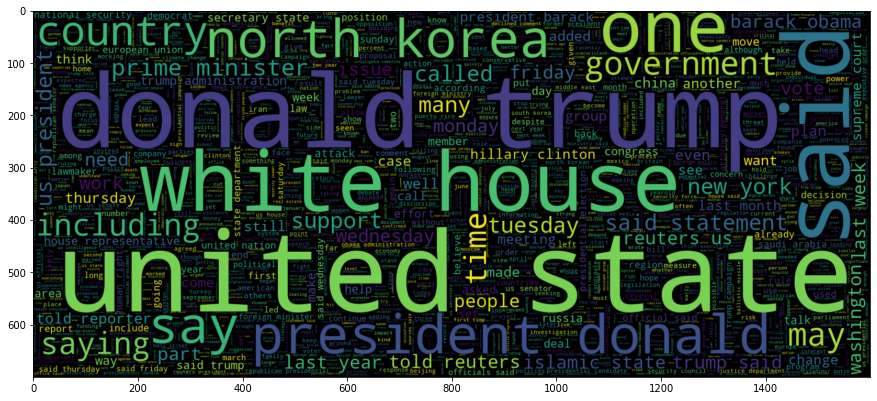

In [ ]:
plt.figure(figsize=(15,15))
wc=WordCloud(max_words=2000, width=1600, height=700, stopwords=STOPWORDS).generate("".join(fake_real_data[fake_real_data.target==1].data_cleaned))
plt.imshow(wc, interpolation="bilinear")

# Wordcloud for fake data to check which words are highlighted more in the news.

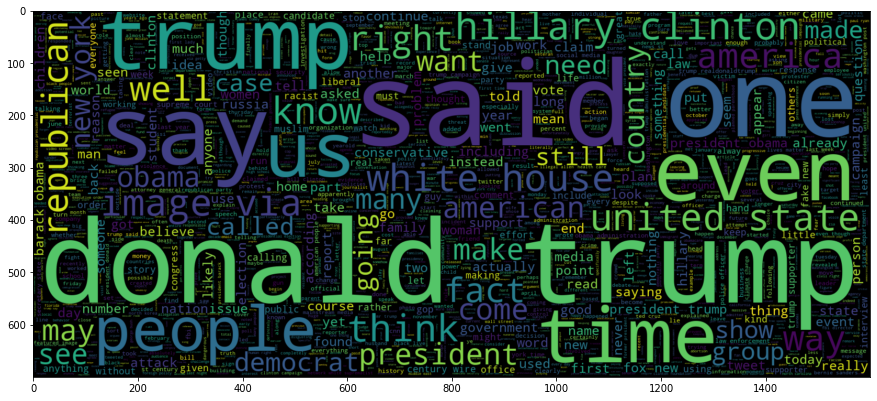

In [ ]:
plt.figure(figsize=(15,15))
wc=WordCloud(max_words=2000, width=1600, height=700, stopwords=STOPWORDS).generate("".join(fake_real_data[fake_real_data.target==0].data_cleaned))
plt.imshow(wc, interpolation="bilinear")



In [61]:
X= [d.split() for d in fake_real_data['data_cleaned'].to_list()]
print(X[0])

['donald', 'trump', 'wish', 'americans', 'happy', 'new', 'year', 'leave', 'instead', 'give', 'shout', 'enemies', 'haters', 'dishonest', 'fake', 'news', 'media', 'former', 'reality', 'show', 'star', 'one', 'job', 'country', 'rapidly', 'grows', 'stronger', 'smarter', 'want', 'wish', 'friends', 'supporters', 'enemies', 'haters', 'even', 'dishonest', 'fake', 'news', 'media', 'happy', 'healthy', 'new', 'year', 'president', 'angry', 'pants', 'tweeted', 'great', 'year', 'america', 'country', 'rapidly', 'grows', 'stronger', 'smarter', 'want', 'wish', 'friends', 'supporters', 'enemies', 'haters', 'even', 'dishonest', 'fake', 'news', 'media', 'happy', 'healthy', 'new', 'year', 'great', 'year', 'america', 'donald', 'j', 'trump', 'realdonaldtrump', 'december', 'trump', 'tweet', 'went', 'welll', 'expectwhat', 'kind', 'president', 'sends', 'new', 'year', 'greeting', 'like', 'despicable', 'petty', 'infantile', 'gibberish', 'trump', 'lack', 'decency', 'even', 'allow', 'rise', 'gutter', 'long', 'enough

In [ ]:
print(len(X))

44898


##Embedding Vectors conversion using Word2vec

In [ ]:
DIM=100
w2v_model = gensim.models.Word2Vec(sentences = X, size = DIM, window =4, min_count =1)

In [59]:
len(w2v_model.wv.vocab)

210459

In [60]:
w2v_model['trump']

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  """Entry point for launching an IPython kernel.


array([-0.43114072,  0.01845673,  0.57813704,  1.9563864 , -0.46135682,
        0.72414726, -0.6230948 , -0.5838472 ,  2.1720388 ,  2.3139224 ,
        4.595897  , -0.28994006,  0.51774704, -1.3572562 ,  1.6886137 ,
       -0.55645555,  1.359524  , -1.3183748 ,  0.78815556, -0.16021577,
       -0.08327101, -0.65324575,  0.12750345, -1.1505064 , -0.2570862 ,
        0.69808215, -0.12525082,  0.39138338, -0.8494472 ,  1.3620521 ,
       -1.7325284 , -1.0089042 , -1.415335  , -1.2536716 , -0.2348107 ,
       -0.8051393 ,  0.133716  , -0.01350877, -1.4232799 , -0.5518807 ,
       -0.53294927,  0.9392975 ,  1.0222553 , -1.6035767 , -0.9821628 ,
        1.1410275 ,  0.6221594 ,  0.5717492 ,  2.94942   , -0.6750259 ,
        0.4994948 ,  1.5420895 , -1.3644156 ,  2.4838293 , -0.62623984,
       -1.521818  ,  0.36468208, -3.188802  , -0.04992913,  1.0239246 ,
       -4.40898   ,  0.3396108 , -0.5053711 ,  2.2595305 ,  0.7337838 ,
       -3.0861142 , -0.51113105, -0.08361028,  0.9381174 ,  2.57

In [ ]:
w2v_model['americans']

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  """Entry point for launching an IPython kernel.


array([ 1.496991  , -0.53766465,  1.4619066 , -1.1310804 , -0.96362597,
        2.6284122 ,  0.39399412, -0.40398404, -0.13655113,  2.4335165 ,
        1.1081915 ,  1.7439412 ,  1.4749703 ,  2.4103315 , -0.04605623,
        0.595252  ,  0.1558914 ,  0.4142472 , -1.0376754 , -0.7262457 ,
       -1.629607  ,  1.6147655 , -2.2133968 , -0.71666366, -1.4506171 ,
       -1.2548486 ,  2.5597994 ,  0.2969928 ,  4.6056314 ,  0.32924193,
       -1.3829898 ,  1.4891223 , -0.07083178,  0.9550204 ,  2.2120714 ,
        3.3945467 , -1.090779  , -1.7826498 , -0.6585887 , -1.1958385 ,
        0.9199705 ,  1.6756717 ,  0.02934776, -0.30923992, -1.373041  ,
       -0.80509895, -1.3821107 , -0.04218768,  0.559955  , -2.1365826 ,
       -0.97396994,  0.15194546,  0.9500631 ,  3.7264223 , -4.987187  ,
        0.30818984,  1.3949578 , -1.321792  , -0.013004  ,  2.1497235 ,
       -1.4032273 ,  0.7425778 ,  1.6521766 , -0.26672986, -0.00846973,
       -1.6428177 ,  0.88441986,  2.2927036 ,  0.02522864, -0.79

In [ ]:
w2v_model.wv.most_similar('trump')

[('presidentelect', 0.6549842953681946),
 ('trumps', 0.6037222743034363),
 ('wireus', 0.5521918535232544),
 ('obama', 0.5354317426681519),
 ('clintonanything', 0.5324350595474243),
 ('cruz', 0.5200037956237793),
 ('trumptrump', 0.5160582065582275),
 ('bush', 0.5102604627609253),
 ('wenz', 0.4918091297149658),
 ('rumsfeld', 0.49115386605262756)]

In [62]:
from tensorflow.keras.preprocessing.text import Tokenizer
tokenizer=Tokenizer()
tokenizer.fit_on_texts(X)
X=tokenizer.texts_to_sequences(X)
X

[[12,
  2,
  2240,
  127,
  1496,
  10,
  32,
  525,
  409,
  271,
  8950,
  2932,
  8951,
  4451,
  545,
  26,
  42,
  34,
  817,
  137,
  958,
  7,
  339,
  36,
  4312,
  10071,
  2685,
  10633,
  90,
  2240,
  805,
  231,
  2932,
  8951,
  35,
  4451,
  545,
  26,
  42,
  1496,
  3885,
  10,
  32,
  5,
  1475,
  5998,
  883,
  242,
  32,
  63,
  36,
  4312,
  10071,
  2685,
  10633,
  90,
  2240,
  805,
  231,
  2932,
  8951,
  35,
  4451,
  545,
  26,
  42,
  1496,
  3885,
  10,
  32,
  242,
  32,
  63,
  12,
  679,
  2,
  375,
  475,
  2,
  703,
  251,
  117372,
  117373,
  604,
  5,
  5459,
  10,
  32,
  15182,
  23,
  6812,
  5999,
  33649,
  30554,
  2,
  1117,
  7320,
  35,
  473,
  1232,
  14673,
  184,
  335,
  2240,
  53,
  465,
  1496,
  10,
  32,
  6611,
  72213,
  21798,
  72214,
  475,
  7,
  2660,
  20857,
  40995,
  475,
  3127,
  4,
  50,
  242,
  32,
  63,
  9,
  1216,
  19570,
  244,
  99,
  13120,
  72215,
  72216,
  475,
  990,
  468,
  628,
  37,
  6,
  633,
  1

In [ ]:
tokenizer.word_index

{'said': 1,
 'trump': 2,
 'us': 3,
 'would': 4,
 'president': 5,
 'people': 6,
 'one': 7,
 'state': 8,
 'also': 9,
 'new': 10,
 'reuters': 11,
 'donald': 12,
 'clinton': 13,
 'house': 14,
 'obama': 15,
 'government': 16,
 'states': 17,
 'republican': 18,
 'could': 19,
 'united': 20,
 'told': 21,
 'white': 22,
 'like': 23,
 'campaign': 24,
 'last': 25,
 'news': 26,
 'two': 27,
 'party': 28,
 'time': 29,
 'election': 30,
 'first': 31,
 'year': 32,
 'washington': 33,
 'former': 34,
 'even': 35,
 'country': 36,
 'many': 37,
 'hillary': 38,
 'years': 39,
 'security': 40,
 'may': 41,
 'media': 42,
 'political': 43,
 'national': 44,
 'say': 45,
 'made': 46,
 'get': 47,
 'law': 48,
 'police': 49,
 'make': 50,
 'court': 51,
 'since': 52,
 'american': 53,
 'percent': 54,
 'going': 55,
 'republicans': 56,
 'presidential': 57,
 'administration': 58,
 'back': 59,
 'russia': 60,
 'bill': 61,
 'democratic': 62,
 'america': 63,
 'support': 64,
 'week': 65,
 'senate': 66,
 'including': 67,
 'group': 68

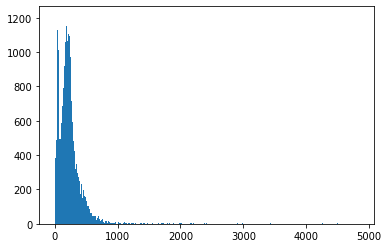

In [63]:
plt.hist([len(x) for x in X],bins=700)
plt.show()

In [64]:
n=np.array([len(x) for x in X])
len(n[n<=1000]) #There are 44k news which has words within 1000

44605

In [65]:
#get size of vocabulary
vocabulary=set()
for text in X:
   for word in text:
     if word  not in vocabulary:
       vocabulary.add(word)

vocab_length=len(vocabulary)
 #get max length of sequence
max_seq_length=0
for text in X:
   if len(text)>max_seq_length:
     max_seq_length=len(text)    
#results
print("vocab length:",vocab_length)
print("max sequence length:",max_seq_length)     

vocab length: 210459
max sequence length: 4841


In [66]:
max_len=1000
X=pad_sequences(X,maxlen=max_len)
len(X[1]) #The sentences are trimmed to 1000 for each ofthe 44k news articles now


1000

In [ ]:
tokenizer.num_words

In [67]:
vocab_size=len(tokenizer.word_index)+1   #Adding an extra zero vector to capture unknown words to avoid the error it throws 
#vocab_size = tokenizer.num_words + 1
print('Vocabulary Size: %d' % vocab_size)
vocab=tokenizer.word_index
vocab

Vocabulary Size: 210460


{'said': 1,
 'trump': 2,
 'us': 3,
 'would': 4,
 'president': 5,
 'people': 6,
 'one': 7,
 'state': 8,
 'also': 9,
 'new': 10,
 'reuters': 11,
 'donald': 12,
 'clinton': 13,
 'house': 14,
 'obama': 15,
 'government': 16,
 'states': 17,
 'republican': 18,
 'could': 19,
 'united': 20,
 'told': 21,
 'white': 22,
 'like': 23,
 'campaign': 24,
 'last': 25,
 'news': 26,
 'two': 27,
 'party': 28,
 'time': 29,
 'election': 30,
 'first': 31,
 'year': 32,
 'washington': 33,
 'former': 34,
 'even': 35,
 'country': 36,
 'many': 37,
 'hillary': 38,
 'years': 39,
 'security': 40,
 'may': 41,
 'media': 42,
 'political': 43,
 'national': 44,
 'say': 45,
 'made': 46,
 'get': 47,
 'law': 48,
 'police': 49,
 'make': 50,
 'court': 51,
 'since': 52,
 'american': 53,
 'percent': 54,
 'going': 55,
 'republicans': 56,
 'presidential': 57,
 'administration': 58,
 'back': 59,
 'russia': 60,
 'bill': 61,
 'democratic': 62,
 'america': 63,
 'support': 64,
 'week': 65,
 'senate': 66,
 'including': 67,
 'group': 68

In [68]:
def get_weight_matrix(model): #Weight matrix is created to map the embedding vectors and its words
  weight_matrix=np.zeros((vocab_size,DIM))
  for word,i in vocab.items():
    weight_matrix[i]=model.wv[word]
  return weight_matrix



In [69]:
embedding_vectors=get_weight_matrix(w2v_model)
embedding_vectors.shape

(210460, 100)

# Splitting the data into train and test

In [70]:
##Train and test data creation
X_train, X_test, Y_train, Y_test = train_test_split(X, fake_real_data['target'],test_size=0.2,stratify = fake_real_data['target'],random_state=42)
# find the length of the largest sentence in training data
#max_len = xtrain.apply(lambda x: len(xtrain)).max()
#print(f'Max number of words in a text in training data: {max_len}')
X_train.shape


(35918, 1000)

In [71]:
X_test.shape

(8980, 1000)

##Modelling using LSTM with Word2Vec

In [72]:
def set_model(embedding_vectors):
    model = Sequential()
    model.add(Embedding(embedding_vectors.shape[0], 
                        output_dim=embedding_vectors.shape[1],
                        weights=[embedding_vectors], 
                        input_length=max_len, 
                        trainable=False))
    model.add(Bidirectional(LSTM(units=64)))
    model.add(Dropout(0.4))
    model.add(Dense(1, activation='sigmoid'))
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['acc'])
    return model

In [74]:
%%time
from keras.callbacks import ModelCheckpoint
from keras.models import load_model
model = set_model(embedding_vectors = embedding_vectors)
model.summary()
from keras.callbacks import Callback, EarlyStopping,ReduceLROnPlateau
#reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, min_lr=1e-6, verbose=1)
early_stop = EarlyStopping(monitor='val_loss', min_delta=0, patience=1, mode='auto')
mc = ModelCheckpoint('best_model.h5', monitor='val_acc', mode='max', verbose=1, save_best_only=True)
batch_size = 64
epochs  = 3
history = model.fit(X_train,Y_train,validation_data=(X_test,Y_test), batch_size = batch_size, epochs = epochs,callbacks=[early_stop,mc])
saved_model = load_model('best_model.h5')
# evaluate the model
_, train_acc = saved_model.evaluate(X_train, Y_train, verbose=0)
_, test_acc = saved_model.evaluate(X_test, Y_test, verbose=0)
print('Train: %.3f, Test: %.3f' % (train_acc, test_acc))


Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_2 (Embedding)     (None, 1000, 100)         21046000  
                                                                 
 bidirectional_1 (Bidirectio  (None, 128)              84480     
 nal)                                                            
                                                                 
 dropout_11 (Dropout)        (None, 128)               0         
                                                                 
 dense_7 (Dense)             (None, 1)                 129       
                                                                 
Total params: 21,130,609
Trainable params: 84,609
Non-trainable params: 21,046,000
_________________________________________________________________
Epoch 1/3
562/562 [==============================] - ETA: 0s - loss: 0.0997 - acc: 0.9678
Epoch 1: val_

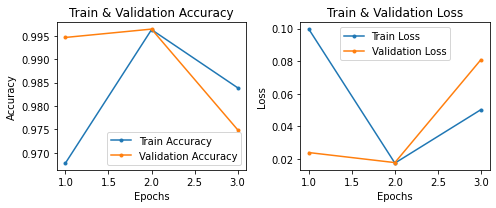

In [75]:
def plot_loss_epochs(history):
    epochs = np.arange(1,len(history.history['acc']) + 1,1)
    train_acc = history.history['acc']
    train_loss = history.history['loss']
    val_acc = history.history['val_acc']
    val_loss = history.history['val_loss']

    fig , ax = plt.subplots(1,2, figsize=(7,3))
    ax[0].plot(epochs , train_acc , '.-' , label = 'Train Accuracy')
    ax[0].plot(epochs , val_acc , '.-' , label = 'Validation Accuracy')
    ax[0].set_title('Train & Validation Accuracy')
    ax[0].legend()
    ax[0].set_xlabel("Epochs")
    ax[0].set_ylabel("Accuracy")

    ax[1].plot(epochs , train_loss , '.-' , label = 'Train Loss')
    ax[1].plot(epochs , val_loss , '.-' , label = 'Validation Loss')
    ax[1].set_title('Train & Validation Loss')
    ax[1].legend()
    ax[1].set_xlabel("Epochs")
    ax[1].set_ylabel("Loss")
    fig.tight_layout()
    fig.show()
plot_loss_epochs(history)

It has been observed that after 2 epochs there is a decrease in the accuracy as we see above.So the optimal number of epochs is 2 for bidirectional LSTM with the given parameters using word2vec.

accuracy: 97.49443207126949
              precision    recall  f1-score   support

        Fake       0.98      0.97      0.98      4696
        Real       0.97      0.98      0.97      4284

    accuracy                           0.97      8980
   macro avg       0.97      0.98      0.97      8980
weighted avg       0.97      0.97      0.97      8980



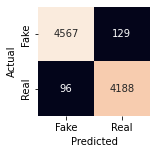

In [76]:
import seaborn as sns
#text_test_tok = tokenizer.texts_to_sequences(xtest)
pred = (model.predict(X_test) > 0.5).astype("int32")
print("accuracy:",accuracy_score(Y_test,pred)*100)
print(classification_report(Y_test, pred, target_names = ['Fake','Real'])) 
cm = pd.DataFrame(confusion_matrix(Y_test,pred))

fig , ax = plt.subplots(figsize = (2,2))
ax = sns.heatmap(cm, annot = True, xticklabels = ['Fake','Real'] , yticklabels = ['Fake','Real'], cbar = False, fmt='')
ax.set_xlabel("Predicted"); ax.set_ylabel("Actual"); fig.show()


In [77]:
#x=['NEW YORK/WASHINGTON (Reuters) - The new U.S. tax code targets high-tax states and may be unconstitutional, New York Governor Andrew Cuomo said on Thursday,saying that the bill may violate New York residentsâ€™ rights to due process and equal protection.  The sweeping Republican tax bill signed into law by U.S. President Donald Trump on Friday introduces a cap, of $10,000,  on deductions of state and local income and property taxes, known as SALT. The tax overhaul was the partyâ€™s first major legislative victory since Trump took office in January.  The SALT provision will hit many taxpayers in states with high incomes, high property values and high taxes, like New York, New Jersey and California. Those states are generally Democratic leaning.  â€œIâ€™m not even sure what they did is legally constitutional and thatâ€™s something weâ€™re looking at now,â€ Cuomo said in an interview with CNN. In an interview with CNBC, Cuomo suggested why the bill may be unconstitutional.  â€œPolitics does not trump the law,â€ Cuomo said on CNBC. â€œYou have the constitution, you have the law, you have due process, you have equal protection. You canâ€™t use politics just because the majority controls to override the law.â€ The Fifth Amendment of the Constitution, better known for its protection against self-incrimination, also protects individuals from seizure of life, liberty or property without due process and has been interpreted by the Supreme Court as guaranteeing equal protection by the law.  Cuomo and California Governor Jerry Brown, both Democrats, have previously said they were exploring legal challenges to SALT deduction limits.  Law professors have said legal challenges would likely rest on arguing that the provision interferes with the protection of statesâ€™ rights under the U.S. Constitutionâ€™s 10th Amendment. Tax attorneys said Cuomoâ€™s legal argument against the tax bill could be that it discriminates and places an unjust tax burden on states that heavily voted for Democrats in the past - known as â€œblue states.â€ â€œThe de facto effect of this legislation is to discriminate against blue states and particularly from (Cuomoâ€™s) perspective the state of New York,â€ said Joseph Callahan, an attorney with the law firm Mackay, Caswell & Callahan in New York.  But some tax experts noted the U.S. Supreme Court has interpreted the 16th Amendment to give Congress broad latitude to tax as it sees fit. In a frequently cited 1934 decision, the Supreme Court called tax deductions a â€œlegislative graceâ€ rather than a vested right. â€œI donâ€™t understand how they think they have a valid lawsuit here,â€ David Gamage, a professor of tax law at Indiana Universityâ€™s Maurer School of Law, told Reuters last week, speaking generally about governors in blue states that could challenge the tax bill.  Cuomo also said on Thursday that New York is proposing a restructuring of its tax code. He provided no details.  A group of 13 law professors on Dec. 18 published a paper suggesting ways that high-tax states could minimize the effects of the SALT deduction cap.  Their suggestions included shifting more of the tax burden onto businesses in the form of higher employer-side payroll taxes, since the federal tax billâ€™s cap on SALT deductions only applies to individuals and not businesses. States also could raise taxes on pass-through entities, which the federal tax bill specifically benefits with a lower rate on a portion of their income. On Friday, Cuomo said he would allow state residents to make a partial or full pre-payment on their property tax bill before Jan. 1, allowing taxpapyers to deduct such payments for 2017 before the cap kicks in, prompting a wave of residents to pay early.  However, the U.S. Internal Revenue Service on Wednesday advised homeowners that the pre-payment of 2018 property taxes may not be deductible.']
x=['US sanctions Russian military shipbuilder, diamond miner']
x=tokenizer.texts_to_sequences(x)
x=pad_sequences(x,maxlen=max_len)

In [78]:
(model.predict(x) >0.5).astype(int)

array([[0]])

# Using Glove for embeddings

In [79]:
fake_real_data['data_cleaned'].shape

(44898,)

In [80]:
# create tokenizer object
tokenizer = Tokenizer()
tokenizer.fit_on_texts(fake_real_data['data_cleaned'].tolist())

word_index = tokenizer.word_index
vocab_size = len(tokenizer.word_index) + 1
print("Vocabulary Size :", vocab_size)

Vocabulary Size : 210460


In [81]:
x_train = pad_sequences(tokenizer.texts_to_sequences(fake_real_data['data_cleaned'].tolist()),
                        maxlen = max_len)
# x_test = pad_sequences(tokenizer.texts_to_sequences(test_data.title),
#                        maxlen = max_sequence_length)

print("Training X Shape:",x_train.shape)

Training X Shape: (44898, 1000)


In [ ]:
print(x_train)

[[    0     0     0 ...  1710 24059   361]
 [    0     0     0 ...   267  6357   361]
 [    0     0     0 ...  3927  8650   361]
 ...
 [    0     0     0 ...   573  4002     1]
 [    0     0     0 ...   359   520  6631]
 [    0     0     0 ...  5475   203   336]]


In [ ]:
word_index

{'said': 1,
 'trump': 2,
 'us': 3,
 'would': 4,
 'president': 5,
 'people': 6,
 'one': 7,
 'state': 8,
 'also': 9,
 'new': 10,
 'reuters': 11,
 'donald': 12,
 'clinton': 13,
 'house': 14,
 'obama': 15,
 'government': 16,
 'states': 17,
 'republican': 18,
 'could': 19,
 'united': 20,
 'told': 21,
 'white': 22,
 'like': 23,
 'campaign': 24,
 'last': 25,
 'news': 26,
 'two': 27,
 'party': 28,
 'time': 29,
 'election': 30,
 'first': 31,
 'year': 32,
 'washington': 33,
 'former': 34,
 'even': 35,
 'country': 36,
 'many': 37,
 'hillary': 38,
 'years': 39,
 'security': 40,
 'may': 41,
 'media': 42,
 'political': 43,
 'national': 44,
 'say': 45,
 'made': 46,
 'get': 47,
 'law': 48,
 'police': 49,
 'make': 50,
 'court': 51,
 'since': 52,
 'american': 53,
 'percent': 54,
 'going': 55,
 'republicans': 56,
 'presidential': 57,
 'administration': 58,
 'back': 59,
 'russia': 60,
 'bill': 61,
 'democratic': 62,
 'america': 63,
 'support': 64,
 'week': 65,
 'senate': 66,
 'including': 67,
 'group': 68

In [ ]:
x_train

array([[    0,     0,     0, ...,  1710, 24059,   361],
       [    0,     0,     0, ...,   267,  6357,   361],
       [    0,     0,     0, ...,  3927,  8650,   361],
       ...,
       [    0,     0,     0, ...,   573,  4002,     1],
       [    0,     0,     0, ...,   359,   520,  6631],
       [    0,     0,     0, ...,  5475,   203,   336]], dtype=int32)

In [82]:
fake_real_data['target'].unique().tolist()


[0, 1]

In [83]:
# y_train = encoder.transform(train_data.label.to_list())
# y_test = encoder.transform(test_data.label.to_list())
y_train = fake_real_data['target']
y_train = y_train.values.reshape(-1,1)
# y_test = y_test.reshape(-1,1)

print("y_train shape:", y_train.shape)
# print("y_test shape:", y_test.shape)

y_train shape: (44898, 1)


In [84]:
X_train, X_test, Y_train, Y_test = train_test_split(x_train,y_train, test_size = 0.2, stratify=y_train,random_state = 42)
X_train.shape

(35918, 1000)

In [85]:
!wget http://nlp.stanford.edu/data/glove.6B.zip


--2022-04-26 20:17:44--  http://nlp.stanford.edu/data/glove.6B.zip
Resolving nlp.stanford.edu (nlp.stanford.edu)... 171.64.67.140
Connecting to nlp.stanford.edu (nlp.stanford.edu)|171.64.67.140|:80... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://nlp.stanford.edu/data/glove.6B.zip [following]
--2022-04-26 20:17:44--  https://nlp.stanford.edu/data/glove.6B.zip
Connecting to nlp.stanford.edu (nlp.stanford.edu)|171.64.67.140|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: http://downloads.cs.stanford.edu/nlp/data/glove.6B.zip [following]
--2022-04-26 20:17:45--  http://downloads.cs.stanford.edu/nlp/data/glove.6B.zip
Resolving downloads.cs.stanford.edu (downloads.cs.stanford.edu)... 171.64.64.22
Connecting to downloads.cs.stanford.edu (downloads.cs.stanford.edu)|171.64.64.22|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 862182613 (822M) [application/zip]
Saving to: ‘glove.6B.zip.1’

glove

In [86]:

!unzip glove*.zip


Archive:  glove.6B.zip
replace glove.6B.50d.txt? [y]es, [n]o, [A]ll, [N]one, [r]ename: Y
  inflating: glove.6B.50d.txt        
replace glove.6B.100d.txt? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: glove.6B.100d.txt       
replace glove.6B.200d.txt? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: glove.6B.200d.txt       
replace glove.6B.300d.txt? [y]es, [n]o, [A]ll, [N]one, [r]ename: y
  inflating: glove.6B.300d.txt       


In [87]:
glv_emb = open('glove.6B.100d.txt', encoding='utf8')

In [88]:
embeddings_index = {}

for line in glv_emb:
    values = line.split()
    word = values[0]
    vectors = np.asarray(values[1:])
    embeddings_index[word] = vectors
        
glv_emb.close()

print('Found %s word vectors.' %len(embeddings_index))

Found 400000 word vectors.


In [89]:
embeddings_index.get('trump')

array(['-0.15731', '-0.75503', '0.36845', '-0.18958', '-0.16896',
       '-0.23157', '-0.22658', '-0.30186', '0.24372', '0.61896',
       '0.58995', '0.047638', '-0.055164', '-0.70211', '0.22084',
       '-0.69232', '0.49419', '1.4285', '-0.25362', '0.20031', '-0.26192',
       '0.05315', '-0.048418', '-0.44982', '0.54644', '-0.014645',
       '-0.015531', '-0.61197', '-0.91964', '-0.7528', '0.64843',
       '1.0934', '0.052682', '0.33345', '0.10532', '0.59517', '0.023104',
       '-0.37105', '0.29749', '-0.23683', '0.079566', '-0.10326',
       '0.35885', '-0.28935', '-0.19881', '0.22908', '-0.061435',
       '0.56127', '-0.017115', '-0.32868', '-0.78417', '-0.49375',
       '0.34944', '0.16278', '-0.061168', '-1.3106', '0.39152', '0.124',
       '-0.20873', '-0.18473', '-0.56184', '0.55693', '0.012114',
       '-0.54545', '-0.31409', '0.1', '0.31543', '0.74757', '-0.47734',
       '-0.18332', '-0.65623', '0.40768', '-0.30697', '-0.47247',
       '-0.7421', '-0.44978', '-0.078122', '-

In [90]:
#verifying how glove behaves if out of vocabulary is given
embeddings_index.get('trump').shape

(100,)

In [91]:
tokenizer.word_index.items()

dict_items([('said', 1), ('trump', 2), ('us', 3), ('would', 4), ('president', 5), ('people', 6), ('one', 7), ('state', 8), ('also', 9), ('new', 10), ('reuters', 11), ('donald', 12), ('clinton', 13), ('house', 14), ('obama', 15), ('government', 16), ('states', 17), ('republican', 18), ('could', 19), ('united', 20), ('told', 21), ('white', 22), ('like', 23), ('campaign', 24), ('last', 25), ('news', 26), ('two', 27), ('party', 28), ('time', 29), ('election', 30), ('first', 31), ('year', 32), ('washington', 33), ('former', 34), ('even', 35), ('country', 36), ('many', 37), ('hillary', 38), ('years', 39), ('security', 40), ('may', 41), ('media', 42), ('political', 43), ('national', 44), ('say', 45), ('made', 46), ('get', 47), ('law', 48), ('police', 49), ('make', 50), ('court', 51), ('since', 52), ('american', 53), ('percent', 54), ('going', 55), ('republicans', 56), ('presidential', 57), ('administration', 58), ('back', 59), ('russia', 60), ('bill', 61), ('democratic', 62), ('america', 63),

In [92]:
#Finding out of vocabulary words
word_vector_matrix=np.zeros((vocab_size,100))
for word,index in tokenizer.word_index.items():
    vector = embeddings_index.get(word)
    if vector is not None:
      word_vector_matrix[index]=vector
    else:
      print(word)    



Streaming output truncated to the last 5000 lines.
dalata
dhgi
elmenaie
swailam
istanbulnew
vacc
ashcloud
suprayogi
junkai
shoppingdriven
chinesepowered
balanceofpower
incidentfree
balsami
kagatigaun
postmonarchy
maysept
nowcommon
minisubs
bruchstein
genevasanaa
etefa
yemenchildren
alshayef
trierscher
volksfreund
bulama
louloua
saudilebanese
inkomo
saood
tehreekelaibak
postred
watercannon
osez
minisme
theregional
rajoysaid
onpuigdemont
aguad
nanl
gakharia
leogrand
bitlyjkkvnt
pmorrcul
odebrechtodbesul
ifigenia
aboutturn
juergin
unlikelylooking
lnnssf
pisally
pissponsored
paszyk
mugabeled
tongoona
annadif
nlnnugh
gpsn
morganlander
jharonne
bbbyo
crimesolving
oxfordstreet
toolenient
steenkamps
majavu
venediktovich
eubrokered
ymeri
nineman
moraleboosting
charmain
needlemarks
rybn
siqi
doublesuspension
miniuprisings
ougadougou
dualnational
fonlladosa
russianjapanese
reutrsjfozpi
lahoreislamabad
indianruled
michelbarnier
trendafilova
holbaek
chinaka
whiterun
jesuiteducated
tariro
aargh
houp

In [99]:
LR = 1e-3
EMBEDDING_DIM = 100
BATCH_SIZE = 64
EPOCHS = 3

In [100]:
import tensorflow as tf
embedding_layer = tf.keras.layers.Embedding(vocab_size,
                                          EMBEDDING_DIM,
                                          weights=[word_vector_matrix],
                                          input_length=1000,
                                          trainable=False)

# **Modelling**

## **BILSTM with Glove**

In [101]:
lstm_model = Sequential()
lstm_model.add(embedding_layer)
lstm_model.add(Bidirectional(LSTM(64)))
lstm_model.add(Dropout(0.4))
lstm_model.add(Dense(1, activation = 'sigmoid'))
lstm_model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['acc'])
print(lstm_model.summary())

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_5 (Embedding)     (None, 1000, 100)         21046000  
                                                                 
 bidirectional_2 (Bidirectio  (None, 128)              84480     
 nal)                                                            
                                                                 
 dropout_12 (Dropout)        (None, 128)               0         
                                                                 
 dense_8 (Dense)             (None, 1)                 129       
                                                                 
Total params: 21,130,609
Trainable params: 84,609
Non-trainable params: 21,046,000
_________________________________________________________________
None


In [104]:
%%time
from keras.callbacks import ReduceLROnPlateau
#reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, min_lr=1e-6, verbose=1)
early_stop = EarlyStopping(monitor='val_loss', min_delta=0, patience=10, mode='auto')
mc = ModelCheckpoint('best_model.h5', monitor='val_acc', mode='max', verbose=1, save_best_only=True)
batch_size = 64
epochs  = 3
history = lstm_model.fit(X_train,Y_train,validation_data=(X_test,Y_test), batch_size = batch_size, epochs = epochs,callbacks=[early_stop,mc])
saved_model = load_model('best_model.h5')
# evaluate the model
_, train_acc = saved_model.evaluate(X_train, Y_train, verbose=0)
_, test_acc = saved_model.evaluate(X_test, Y_test, verbose=0)
print('Train: %.3f, Test: %.3f' % (train_acc, test_acc))

Epoch 1/3
562/562 [==============================] - ETA: 0s - loss: 0.2349 - acc: 0.9079
Epoch 1: val_acc improved from -inf to 0.93363, saving model to best_model.h5
562/562 [==============================] - 555s 988ms/step - loss: 0.2349 - acc: 0.9079 - val_loss: 0.1685 - val_acc: 0.9336
Epoch 2/3
562/562 [==============================] - ETA: 0s - loss: 0.1291 - acc: 0.9544
Epoch 2: val_acc improved from 0.93363 to 0.97650, saving model to best_model.h5
562/562 [==============================] - 533s 949ms/step - loss: 0.1291 - acc: 0.9544 - val_loss: 0.0700 - val_acc: 0.9765
Epoch 3/3
562/562 [==============================] - ETA: 0s - loss: 0.0752 - acc: 0.9744
Epoch 3: val_acc improved from 0.97650 to 0.99488, saving model to best_model.h5
562/562 [==============================] - 532s 946ms/step - loss: 0.0752 - acc: 0.9744 - val_loss: 0.0235 - val_acc: 0.9949
Train: 0.995, Test: 0.995
CPU times: user 1h 38min 35s, sys: 6min 55s, total: 1h 45min 30s
Wall time: 30min 30s


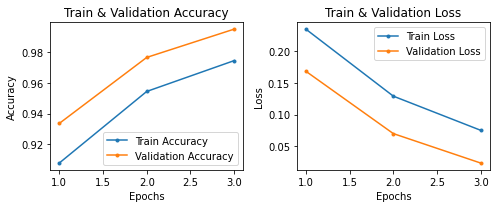

In [105]:
def plot_loss_epochs(history):
    epochs = np.arange(1,len(history.history['acc']) + 1,1)
    train_acc = history.history['acc']
    train_loss = history.history['loss']
    val_acc = history.history['val_acc']
    val_loss = history.history['val_loss']

    fig , ax = plt.subplots(1,2, figsize=(7,3))
    ax[0].plot(epochs , train_acc , '.-' , label = 'Train Accuracy')
    ax[0].plot(epochs , val_acc , '.-' , label = 'Validation Accuracy')
    ax[0].set_title('Train & Validation Accuracy')
    ax[0].legend()
    ax[0].set_xlabel("Epochs")
    ax[0].set_ylabel("Accuracy")

    ax[1].plot(epochs , train_loss , '.-' , label = 'Train Loss')
    ax[1].plot(epochs , val_loss , '.-' , label = 'Validation Loss')
    ax[1].set_title('Train & Validation Loss')
    ax[1].legend()
    ax[1].set_xlabel("Epochs")
    ax[1].set_ylabel("Loss")
    fig.tight_layout()
    fig.show()
plot_loss_epochs(history)


accuracy: 99.48775055679288
              precision    recall  f1-score   support

        Fake       0.99      1.00      1.00      4696
    Not Fake       1.00      0.99      0.99      4284

    accuracy                           0.99      8980
   macro avg       1.00      0.99      0.99      8980
weighted avg       0.99      0.99      0.99      8980



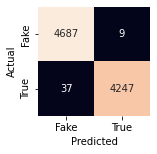

In [106]:
import seaborn as sns
#text_test_tok = tokenizer.texts_to_sequences(xtest)
pred = (lstm_model.predict(X_test) > 0.5).astype("int32")
print("accuracy:",accuracy_score(Y_test,pred)*100)
print(classification_report(Y_test, pred, target_names = ['Fake','Not Fake'])) 
cm = pd.DataFrame(confusion_matrix(Y_test,pred))

fig , ax = plt.subplots(figsize = (2,2))
ax = sns.heatmap(cm, annot = True, xticklabels = ['Fake','True'] , yticklabels = ['Fake','True'], cbar = False, fmt='')
ax.set_xlabel("Predicted"); ax.set_ylabel("Actual"); fig.show()


In [107]:
#creating a function to preprocess unseen data before prediction
def get_encode(x):
  x1=clean_text(x)
  X= [d.split() for d in x1.to_list()]
  X2=tokenizer.texts_to_sequences(X)
  X3=pad_sequences(X2,maxlen=max_len)
  return x3


# **GRU with Glove embeddings**

In [111]:
gru_model = Sequential()
gru_model.add(Embedding(vocab_size, EMBEDDING_DIM, trainable = False, weights=[word_vector_matrix]))
#gru_model.add(Dropout(0.2))
gru_model.add(Bidirectional(GRU(64)))
#gru_model.add(Dense(64, activation='relu'))
gru_model.add(Dropout(0.2))
gru_model.add(Dense(1, activation = 'sigmoid'))
gru_model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['acc'])
print(gru_model.summary())

Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_8 (Embedding)     (None, None, 100)         21046000  
                                                                 
 bidirectional_4 (Bidirectio  (None, 128)              63744     
 nal)                                                            
                                                                 
 dropout_15 (Dropout)        (None, 128)               0         
                                                                 
 dense_12 (Dense)            (None, 1)                 129       
                                                                 
Total params: 21,109,873
Trainable params: 63,873
Non-trainable params: 21,046,000
_________________________________________________________________
None


In [112]:
%%time
from keras.callbacks import ReduceLROnPlateau
#reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, min_lr=1e-6, verbose=1)
early_stop = EarlyStopping(monitor='val_loss', min_delta=0, patience=1, mode='auto')
mc = ModelCheckpoint('best_model.h5', monitor='val_acc', mode='max', verbose=1, save_best_only=True)
batch_size = 64
epochs  = 3
history = gru_model.fit(X_train,Y_train,validation_data=(X_test,Y_test), batch_size = batch_size, epochs = epochs,callbacks=[early_stop,mc])
saved_model = load_model('best_model.h5')
# evaluate the model
_, train_acc = saved_model.evaluate(X_train, Y_train, verbose=0)
_, test_acc = saved_model.evaluate(X_test, Y_test, verbose=0)
print('Train: %.3f, Test: %.3f' % (train_acc, test_acc))


Epoch 1/3
562/562 [==============================] - ETA: 0s - loss: 0.1093 - acc: 0.9578
Epoch 1: val_acc improved from -inf to 0.99766, saving model to best_model.h5
562/562 [==============================] - 546s 857ms/step - loss: 0.1093 - acc: 0.9578 - val_loss: 0.0122 - val_acc: 0.9977
Epoch 2/3
562/562 [==============================] - ETA: 0s - loss: 0.0106 - acc: 0.9972
Epoch 2: val_acc did not improve from 0.99766
562/562 [==============================] - 476s 847ms/step - loss: 0.0106 - acc: 0.9972 - val_loss: 0.0106 - val_acc: 0.9977
Epoch 3/3
562/562 [==============================] - ETA: 0s - loss: 0.0077 - acc: 0.9980
Epoch 3: val_acc improved from 0.99766 to 0.99788, saving model to best_model.h5
562/562 [==============================] - 479s 853ms/step - loss: 0.0077 - acc: 0.9980 - val_loss: 0.0096 - val_acc: 0.9979
Train: 0.999, Test: 0.998
CPU times: user 1h 26min 43s, sys: 5min 58s, total: 1h 32min 42s
Wall time: 27min 55s


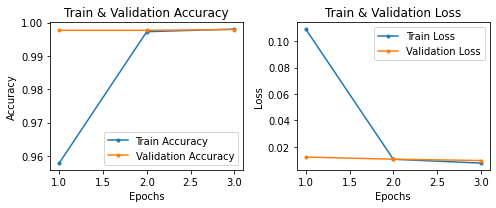

In [113]:
def plot_loss_epochs(history):
    epochs = np.arange(1,len(history.history['acc']) + 1,1)
    train_acc = history.history['acc']
    train_loss = history.history['loss']
    val_acc = history.history['val_acc']
    val_loss = history.history['val_loss']

    fig , ax = plt.subplots(1,2, figsize=(7,3))
    ax[0].plot(epochs , train_acc , '.-' , label = 'Train Accuracy')
    ax[0].plot(epochs , val_acc , '.-' , label = 'Validation Accuracy')
    ax[0].set_title('Train & Validation Accuracy')
    ax[0].legend()
    ax[0].set_xlabel("Epochs")
    ax[0].set_ylabel("Accuracy")

    ax[1].plot(epochs , train_loss , '.-' , label = 'Train Loss')
    ax[1].plot(epochs , val_loss , '.-' , label = 'Validation Loss')
    ax[1].set_title('Train & Validation Loss')
    ax[1].legend()
    ax[1].set_xlabel("Epochs")
    ax[1].set_ylabel("Loss")
    fig.tight_layout()
    fig.show()
plot_loss_epochs(history)


accuracy: 99.78841870824053
              precision    recall  f1-score   support

        Fake       1.00      1.00      1.00      4696
    Not Fake       1.00      1.00      1.00      4284

    accuracy                           1.00      8980
   macro avg       1.00      1.00      1.00      8980
weighted avg       1.00      1.00      1.00      8980



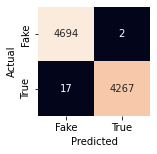

In [114]:
import seaborn as sns
#text_test_tok = tokenizer.texts_to_sequences(xtest)
pred = (gru_model.predict(X_test) >0.5).astype("int32")
print("accuracy:",accuracy_score(Y_test,pred)*100)
print(classification_report(Y_test, pred, target_names = ['Fake','Not Fake'])) 
cm = pd.DataFrame(confusion_matrix(Y_test,pred))

fig , ax = plt.subplots(figsize = (2,2))
ax = sns.heatmap(cm, annot = True, xticklabels = ['Fake','True'] , yticklabels = ['Fake','True'], cbar = False, fmt='')
ax.set_xlabel("Predicted"); ax.set_ylabel("Actual"); fig.show()


**Modelling with CNN and GRU using GLOVE embeddings**

In [120]:
%%time
from keras.layers import Dense, Flatten, LSTM, Conv1D, MaxPooling1D, Dropout, Activation
def create_conv_model():
    model_conv = Sequential()
    model_conv.add(embedding_layer)
    #model_conv.add(Dropout(0.2))
    model_conv.add(Conv1D(64, 5, activation='relu'))
    model_conv.add(MaxPooling1D(pool_size=4))
    model_conv.add(Dropout(0.2))
    model_conv.add(Bidirectional(GRU(64,dropout=0.2)))
    model_conv.add(Dense(1, activation='sigmoid'))
    model_conv.compile(loss='binary_crossentropy', optimizer='adam',    metrics=['acc'])
    return model_conv
model_conv = create_conv_model()
model_conv.summary()
#history = model_conv.fit(X_train,Y_train,epochs=6, validation_data=(X_test, Y_test),batch_size=64)

Model: "sequential_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_5 (Embedding)     (None, 1000, 100)         21046000  
                                                                 
 conv1d_12 (Conv1D)          (None, 996, 64)           32064     
                                                                 
 max_pooling1d_2 (MaxPooling  (None, 249, 64)          0         
 1D)                                                             
                                                                 
 dropout_18 (Dropout)        (None, 249, 64)           0         
                                                                 
 bidirectional_6 (Bidirectio  (None, 128)              49920     
 nal)                                                            
                                                                 
 dense_14 (Dense)            (None, 1)               

In [121]:
%%time
from keras.callbacks import ReduceLROnPlateau
#reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, min_lr=1e-6, verbose=1)
early_stop = EarlyStopping(monitor='val_loss', min_delta=0, patience=1, mode='auto')
mc = ModelCheckpoint('best_model.h5', monitor='val_acc', mode='max', verbose=1, save_best_only=True)
batch_size = 64
epochs  = 3
history = model_conv.fit(X_train,Y_train,validation_data=(X_test,Y_test), batch_size = batch_size, epochs = epochs,callbacks=[early_stop,mc])
saved_model = load_model('best_model.h5')
# evaluate the model
_, train_acc = saved_model.evaluate(X_train, Y_train, verbose=0)
_, test_acc = saved_model.evaluate(X_test, Y_test, verbose=0)
print('Train: %.3f, Test: %.3f' % (train_acc, test_acc))


Epoch 1/3
562/562 [==============================] - ETA: 0s - loss: 0.0888 - acc: 0.9652
Epoch 1: val_acc improved from -inf to 0.99744, saving model to best_model.h5
562/562 [==============================] - 276s 414ms/step - loss: 0.0888 - acc: 0.9652 - val_loss: 0.0092 - val_acc: 0.9974
Epoch 2/3
562/562 [==============================] - ETA: 0s - loss: 0.0085 - acc: 0.9979
Epoch 2: val_acc improved from 0.99744 to 0.99833, saving model to best_model.h5
562/562 [==============================] - 232s 412ms/step - loss: 0.0085 - acc: 0.9979 - val_loss: 0.0068 - val_acc: 0.9983
Epoch 3/3
562/562 [==============================] - ETA: 0s - loss: 0.0051 - acc: 0.9987
Epoch 3: val_acc did not improve from 0.99833
562/562 [==============================] - 235s 419ms/step - loss: 0.0051 - acc: 0.9987 - val_loss: 0.0060 - val_acc: 0.9983
Train: 0.998, Test: 0.998
CPU times: user 41min 37s, sys: 1min 58s, total: 43min 36s
Wall time: 13min 44s


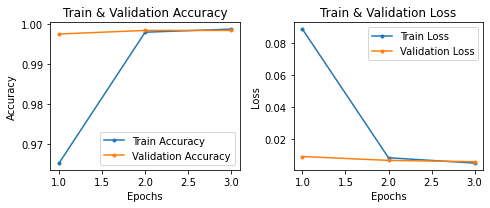

In [122]:
def plot_loss_epochs(history):
    epochs = np.arange(1,len(history.history['acc']) + 1,1)
    train_acc = history.history['acc']
    train_loss = history.history['loss']
    val_acc = history.history['val_acc']
    val_loss = history.history['val_loss']

    fig , ax = plt.subplots(1,2, figsize=(7,3))
    ax[0].plot(epochs , train_acc , '.-' , label = 'Train Accuracy')
    ax[0].plot(epochs , val_acc , '.-' , label = 'Validation Accuracy')
    ax[0].set_title('Train & Validation Accuracy')
    ax[0].legend()
    ax[0].set_xlabel("Epochs")
    ax[0].set_ylabel("Accuracy")

    ax[1].plot(epochs , train_loss , '.-' , label = 'Train Loss')
    ax[1].plot(epochs , val_loss , '.-' , label = 'Validation Loss')
    ax[1].set_title('Train & Validation Loss')
    ax[1].legend()
    ax[1].set_xlabel("Epochs")
    ax[1].set_ylabel("Loss")
    fig.tight_layout()
    fig.show()
plot_loss_epochs(history)


accuracy: 99.83296213808464
              precision    recall  f1-score   support

        Fake       1.00      1.00      1.00      4696
    Not Fake       1.00      1.00      1.00      4284

    accuracy                           1.00      8980
   macro avg       1.00      1.00      1.00      8980
weighted avg       1.00      1.00      1.00      8980



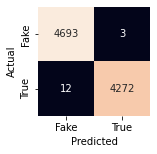

In [123]:
import seaborn as sns
#text_test_tok = tokenizer.texts_to_sequences(xtest)
pred = (model_conv.predict(X_test) >0.5).astype("int32")
print("accuracy:",accuracy_score(Y_test,pred)*100)
print(classification_report(Y_test, pred, target_names = ['Fake','Not Fake'])) 
cm = pd.DataFrame(confusion_matrix(Y_test,pred))

fig , ax = plt.subplots(figsize = (2,2))
ax = sns.heatmap(cm, annot = True, xticklabels = ['Fake','True'] , yticklabels = ['Fake','True'], cbar = False, fmt='')
ax.set_xlabel("Predicted"); ax.set_ylabel("Actual"); fig.show()


In [124]:
x1='Psaki Refuses to Explain Why Biden Wrote College Recommendation Letter for Chinese Businessman’s Son'
x='House Intelligence Committee Chairman Devin Nunes is going to have a bad day. He s been under the assumption, like many of us, that the Christopher Steele-dossier was what prompted the Russia investigation so he s been lashing out at the Department of Justice and the FBI in order to protect Trump. As it happens, the dossier is not what started the investigation, according to documents obtained by the New York Times.Former Trump campaign adviser George Papadopoulos was drunk in a wine bar when he revealed knowledge of Russian opposition research on Hillary Clinton.On top of that, Papadopoulos wasn t just a covfefe boy for Trump, as his administration has alleged. He had a much larger role, but none so damning as being a drunken fool in a wine bar. Coffee boys  don t help to arrange a New York meeting between Trump and President Abdel Fattah el-Sisi of Egypt two months before the election. It was known before that the former aide set up meetings with world leaders for Trump, but team Trump ran with him being merely a coffee boy.In May 2016, Papadopoulos revealed to Australian diplomat Alexander Downer that Russian officials were shopping around possible dirt on then-Democratic presidential nominee Hillary Clinton. Exactly how much Mr. Papadopoulos said that night at the Kensington Wine Rooms with the Australian, Alexander Downer, is unclear,  the report states.  But two months later, when leaked Democratic emails began appearing online, Australian officials passed the information about Mr. Papadopoulos to their American counterparts, according to four current and former American and foreign officials with direct knowledge of the Australians  role. Papadopoulos pleaded guilty to lying to the F.B.I. and is now a cooperating witness with Special Counsel Robert Mueller s team.This isn t a presidency. It s a badly scripted reality TV show.Photo by Win McNamee/Getty Images.'
token=tokenizer.texts_to_sequences(x)
token_pad=pad_sequences(token,maxlen=max_len)
result=(model_conv.predict(token_pad) >0.5).astype(int)
result


array([[0],
       [0],
       [0],
       ...,
       [0],
       [0],
       [0]])

In [126]:
!pip install creme

     |████████████████████████████████| 1.1 MB 5.2 MB/s 
  Created wheel for mmh3: filename=mmh3-2.5.1-cp37-cp37m-linux_x86_64.whl size=39664 sha256=981ba155b7b6325d80b428d177a784fd8fb549092465af3a1b14c2e24f70cb57
  Stored in directory: /root/.cache/pip/wheels/ae/45/25/90e097a519143b2dca74cd93a056894a965f27908103e01799
Successfully built mmh3


##CNN with Online learning classifier

In [160]:
%%time
from keras.layers import Dense, Flatten, LSTM, Conv1D, MaxPooling1D, Dropout, Activation,GlobalMaxPooling1D,BatchNormalization
from keras.callbacks import ReduceLROnPlateau,EarlyStopping,ModelCheckpoint

def create_conv_model():
    model_conv = Sequential()
    model_conv.add(embedding_layer)
    #model_conv.add(Dropout(0.3))
    model_conv.add(Conv1D(128, 5, activation='relu',padding='same'))
    #model_conv.add(BatchNormalization())
    model_conv.add(MaxPooling1D(5,name='feature_layer'))
    #model_conv.add(Conv1D(64, 3, activation='relu',padding='same'))
   # model_conv.add(MaxPooling1D(3,name='feature_layer1'))
   # model_conv.add(GlobalMaxPooling1D(name='feature_layer1'))
    model_conv.add(Dropout(0.4))
    model_conv.add(Flatten())
    #model_conv.add(Dropout(0.4))
    model_conv.add(Dense(128, activation='relu', name='my_dense'))
    model_conv.add(Dense(1, activation='sigmoid'))
    model_conv.compile(loss='binary_crossentropy', optimizer='adam',metrics=['acc'])
    return model_conv
model_conv = create_conv_model()
model_conv.summary()
early_stop = EarlyStopping(monitor='val_loss', min_delta=0, patience=1, mode='auto')
mc = ModelCheckpoint('best_model.h5', monitor='val_acc', mode='max', verbose=1, save_best_only=True)
model_conv.fit(X_train,Y_train,epochs=3, validation_data=(X_test, Y_test),batch_size=64,callbacks=[early_stop,mc])

Model: "sequential_21"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_5 (Embedding)     (None, 1000, 100)         21046000  
                                                                 
 conv1d_21 (Conv1D)          (None, 1000, 128)         64128     
                                                                 
 feature_layer (MaxPooling1D  (None, 200, 128)         0         
 )                                                               
                                                                 
 dropout_22 (Dropout)        (None, 200, 128)          0         
                                                                 
 flatten_2 (Flatten)         (None, 25600)             0         
                                                                 
 my_dense (Dense)            (None, 128)               3276928   
                                                     

In [161]:
from keras.models import Sequential, Model

model_feat = Model(inputs=model_conv.input,outputs=model_conv.get_layer('my_dense').output)
feat_train = model_feat.predict(X_train)
print(feat_train.shape)



(35918, 128)


In [162]:

feat_test= model_feat.predict(X_test)
print(feat_test.shape)

(8980, 128)


In [163]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
feat_train = sc.fit_transform(feat_train)
feat_test = sc.transform (feat_test)

In [164]:
feat_train

array([[-0.14141306,  0.        , -0.00857363, ...,  0.8356689 ,
        -0.78159434, -0.9315552 ],
       [ 0.77216405,  0.        , -0.00857363, ..., -0.32268068,
        -0.78159434, -0.9315552 ],
       [-0.74962085,  0.        , -0.00857363, ..., -0.32268068,
         0.04217218,  0.89981204],
       ...,
       [-0.74962085,  0.        , -0.00857363, ..., -0.32268068,
         0.6478174 ,  1.4312764 ],
       [-0.74962085,  0.        , -0.00857363, ..., -0.32268068,
         2.500272  ,  2.0297656 ],
       [ 1.0357684 ,  0.        , -0.00857363, ..., -0.32268068,
        -0.78159434, -0.9315552 ]], dtype=float32)

In [165]:
feat_test

array([[-0.33616376,  0.        , -0.00857363, ...,  1.7699661 ,
        -0.78159434, -0.54092795],
       [-0.445731  ,  0.        , -0.00857363, ...,  1.6138805 ,
        -0.19972412, -0.47683313],
       [-0.74962085,  0.        , -0.00857363, ..., -0.32268068,
         0.14808168,  0.7682111 ],
       ...,
       [ 1.148175  ,  0.        , -0.00857363, ..., -0.32268068,
        -0.78159434, -0.9315552 ],
       [ 0.7767521 ,  0.        , -0.00857363, ..., -0.32268068,
        -0.36136046, -0.9098406 ],
       [-0.74962085,  0.        , -0.00857363, ..., -0.32268068,
         0.7430553 ,  0.66501284]], dtype=float32)

In [166]:
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.metrics import accuracy_score,confusion_matrix
linear_clf = PassiveAggressiveClassifier(random_state=42)
linear_clf.fit(feat_train, Y_train.ravel())
pred = linear_clf.predict(feat_test)
score = accuracy_score(Y_test,pred)
print(score)
print(confusion_matrix(Y_test,pred))
print(classification_report(Y_test, pred))

0.9975501113585746
[[4688    8]
 [  14 4270]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      4696
           1       1.00      1.00      1.00      4284

    accuracy                           1.00      8980
   macro avg       1.00      1.00      1.00      8980
weighted avg       1.00      1.00      1.00      8980

